In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wildfire/sd-3layers.jpg


# Loading the libraries we need: numpy, scipy, matplotlib

In [2]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt
import imageio

**Creating a numpy array from an image file:**


**Lets choose a WIFIRE satellite image file as an ndarray and display its type.**

In [3]:
from skimage import data
import cv2

photo_data = cv2.imread('../input/wildfire/sd-3layers.jpg')

# Note: In the video, this is mentioned as an ndarray. Don't worry about the type for now, it should
# still work as usual.
type(photo_data)

numpy.ndarray

**Let's see what is in this image.**

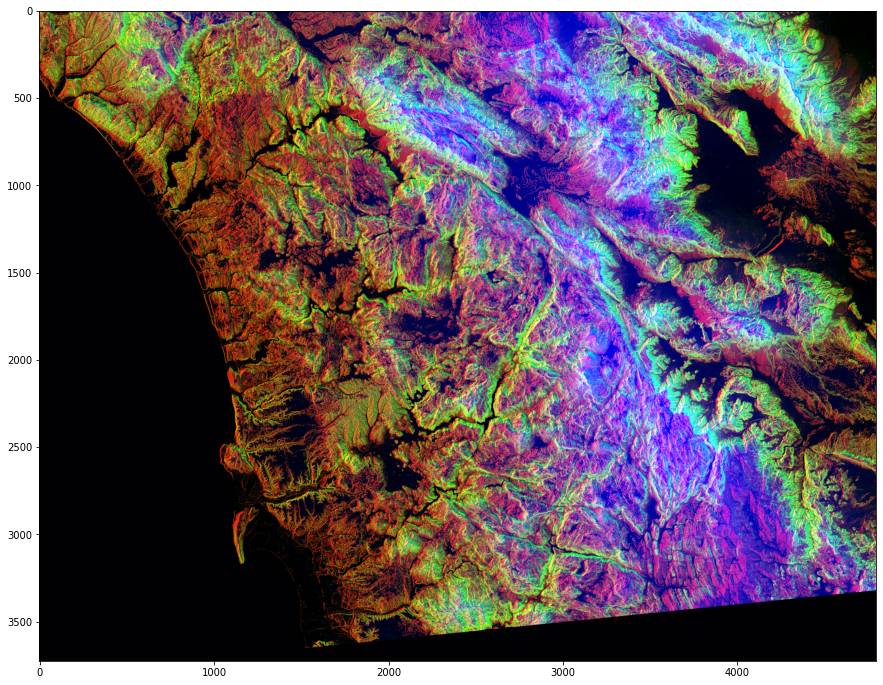

In [4]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [5]:
photo_data.shape

print(photo_data)

[[[ 57  17   0]
  [ 71  11   0]
  [135  33  15]
  ...
  [ 77  25  19]
  [ 33   4   0]
  [ 17  14   0]]

 [[125  59  34]
  [130  47  25]
  [155  37  20]
  ...
  [ 44   6   1]
  [ 34   5   0]
  [ 22   4   0]]

 [[170  53  26]
  [165  37  14]
  [178  27  12]
  ...
  [ 14   4   0]
  [ 31   5   0]
  [ 55   4   1]]

 ...

 [[  1   0   2]
  [  1   0   2]
  [  1   0   2]
  ...
  [  1   0   2]
  [  1   0   2]
  [  1   0   2]]

 [[  1   0   2]
  [  1   0   2]
  [  1   0   2]
  ...
  [  1   0   2]
  [  1   0   2]
  [  1   0   2]]

 [[  1   0   2]
  [  1   0   2]
  [  1   0   2]
  ...
  [  1   0   2]
  [  1   0   2]
  [  1   0   2]]]


**The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue.**

**RGB Color Mapping in the Photo:**


**RED pixel indicates Altitude**

**BLUE pixel indicates Aspect**

**GREEN pixel indicates Slope**


**The higher values denote higher altitude, aspect and slope.**

In [6]:
photo_data.size

53606475

In [7]:
photo_data.min(), photo_data.max()

(0, 255)

In [8]:
photo_data.mean()

75.77772429543259

**Pixel on the 150th Row and 250th Column**

In [9]:
photo_data[150, 250]

array([233,  42,  15], dtype=uint8)

In [10]:
photo_data[150, 250, 1]

42

# Set a Pixel to All Zeros

**We can set all three layer in a pixel as once by assigning zero globally to that (row,column) pairing. However, setting one pixel to zero is not noticeable.**

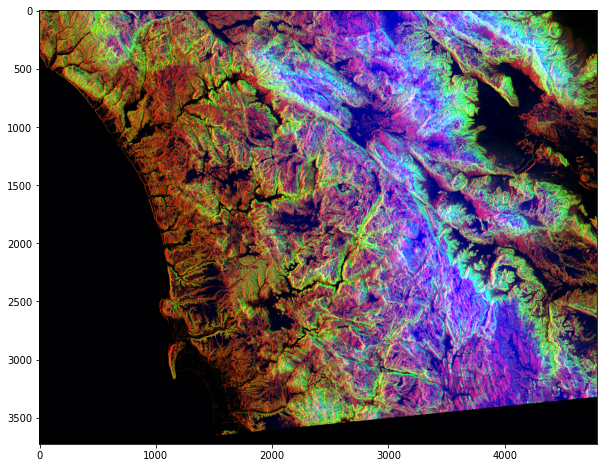

In [11]:
#photo_data = misc.imread('../input/wildfire/sd-3layers.jpg')
photo_data[150, 250] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

# Changing Colors in a Range

**We can also use a range to change the pixel values. As an example, let's set the green layer for rows 200 t0 800 to full intensity.**

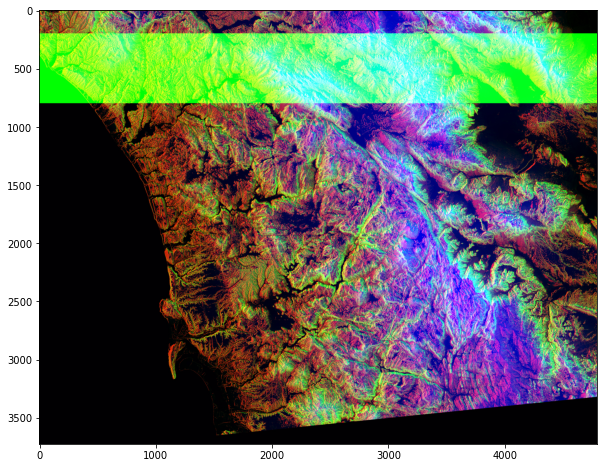

In [12]:
photo_data = cv2.imread('../input/wildfire/sd-3layers.jpg')

photo_data[200:800, : ,1] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

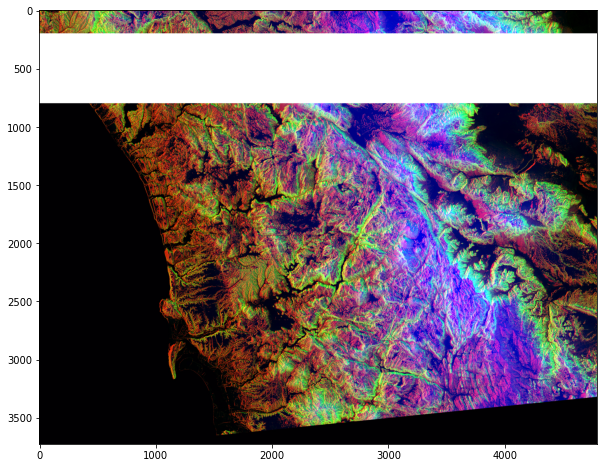

In [13]:
photo_data = cv2.imread('../input/wildfire/sd-3layers.jpg')

photo_data[200:800, :] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

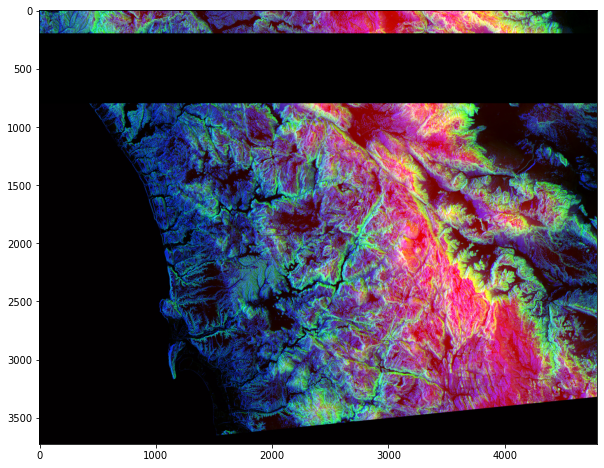

In [14]:
photo_data = imageio.imread('../input/wildfire/sd-3layers.jpg')

photo_data[200:800, :] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

# Pick all Pixels with Low Values

In [15]:
photo_data = cv2.imread('../input/wildfire/sd-3layers.jpg')
print("Shape of photo_data:", photo_data.shape)
low_value_filter = photo_data < 50
print("Shape of low_value_filter:", low_value_filter.shape)

Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)


# Filtering Out Low Values

**Whenever the low_value_filter is True, set value to 0.**

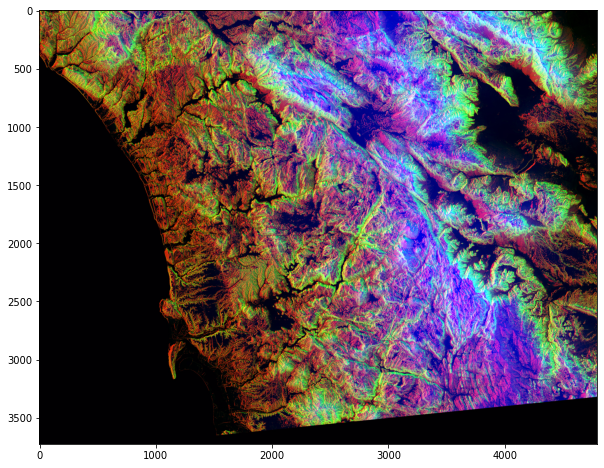

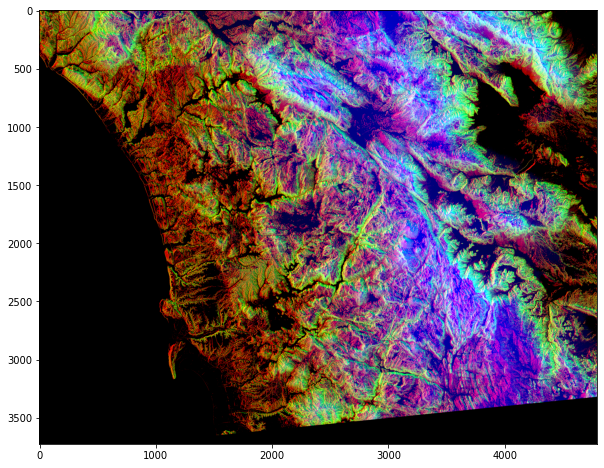

In [16]:
# import random
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

# More Row and Column Operations

**You can design complex patters by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.**

In [17]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [18]:
photo_data[rows_range, cols_range] = 255

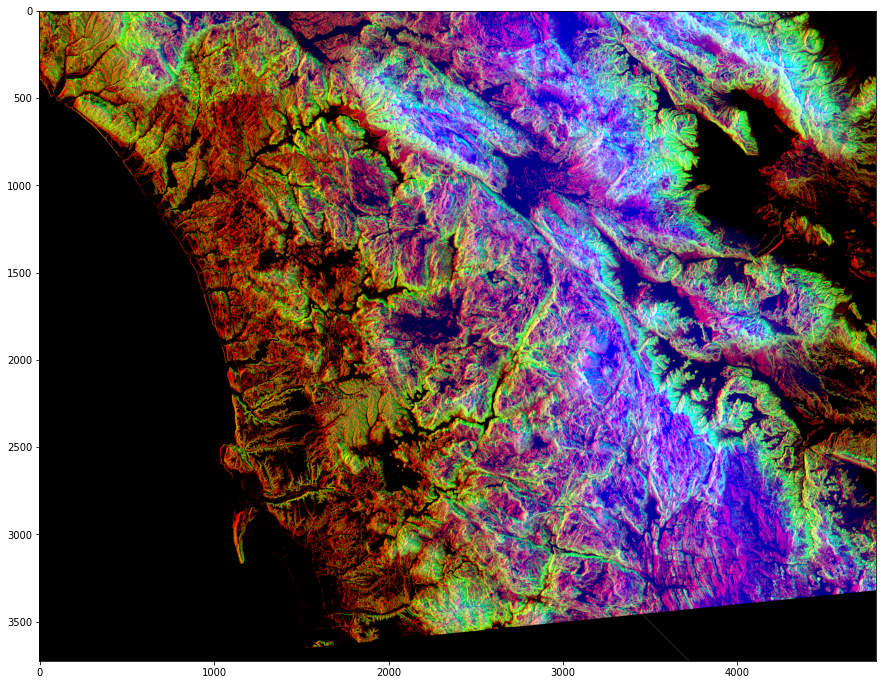

In [19]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# Masking Images
**Now let us try something even cooler...a mask that is in shape of a circular disc.**

In [20]:
total_rows, total_cols, total_layers = photo_data.shape
#print("photo_data = ", photo_data.shape)

X, Y = np.ogrid[:total_rows, :total_cols]
#print("X = ", X.shape, " and Y = ", Y.shape)

In [21]:
center_row, center_col = total_rows / 2, total_cols / 2
#print("center_row = ", center_row, "AND center_col = ", center_col)
#print(X - center_row)
#print(Y - center_col)
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
#print(dist_from_center)
radius = (total_rows / 2)**2
#print("Radius = ", radius)
circular_mask = (dist_from_center > radius)
#print(circular_mask)
print(circular_mask[1500:1700,2000:2200])

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


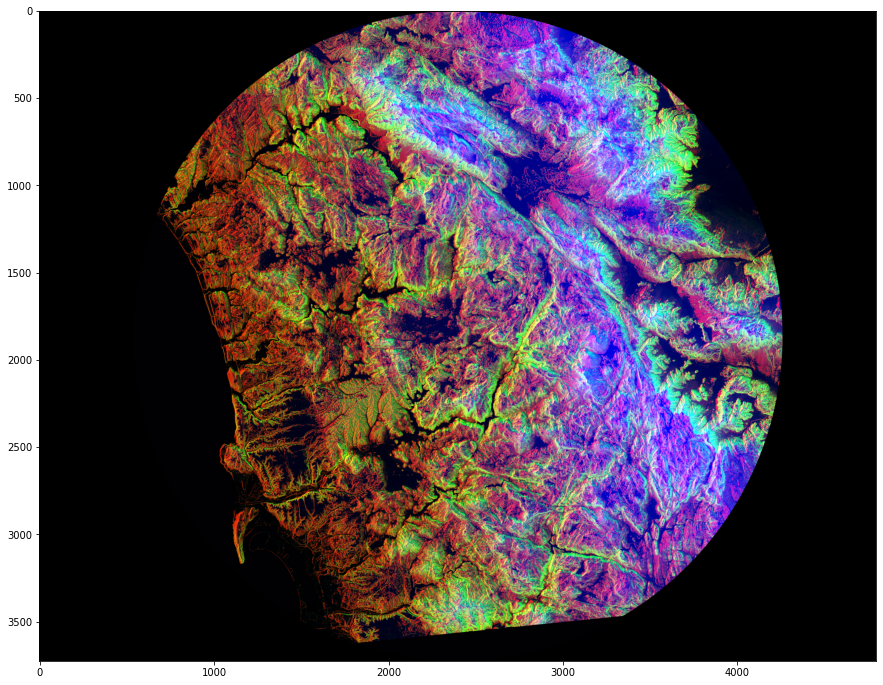

In [22]:
photo_data = cv2.imread('../input/wildfire/sd-3layers.jpg')
photo_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# Further Masking

**You can further improve the mask. For example, just get the upper half of the disc.**

In [23]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row # this line generates a mask for all rows above the center

half_upper_mask = np.logical_and(half_upper, circular_mask)

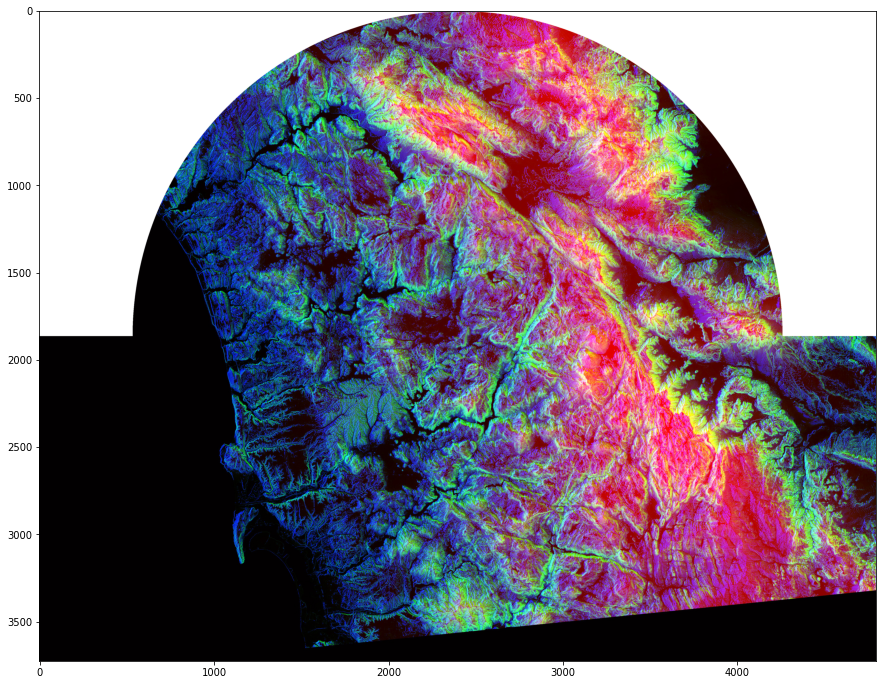

In [24]:
photo_data = imageio.imread('../input/wildfire/sd-3layers.jpg')
photo_data[half_upper_mask] = 255
#photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

**Further Processing of our Satellite Imagery**

**Processing of RED Pixels**

**Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas.**

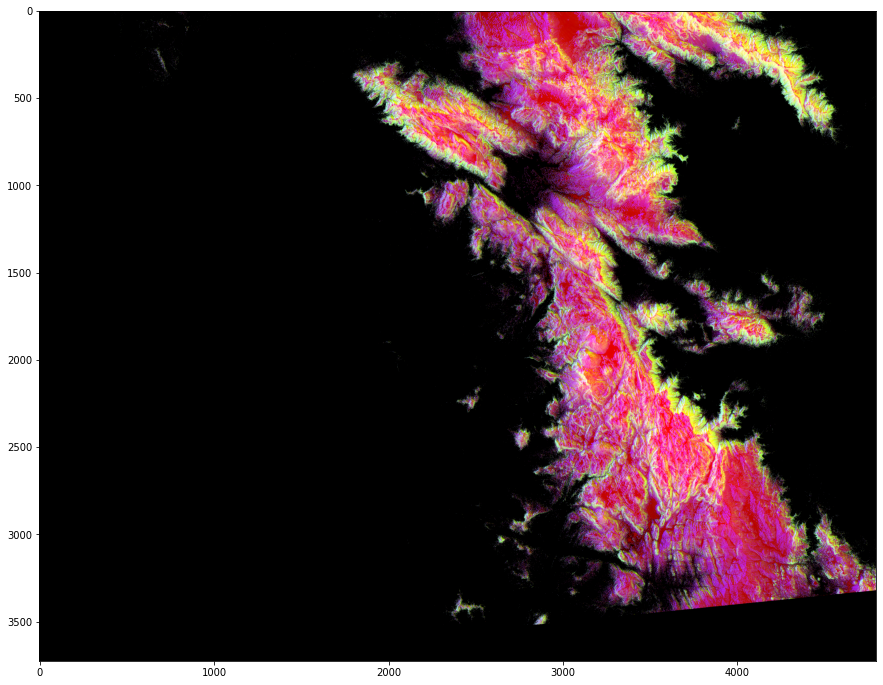

In [25]:
photo_data = imageio.imread('../input/wildfire/sd-3layers.jpg')
red_mask   = photo_data[:, : ,0] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# Detecting Highly-GREEN Pixels

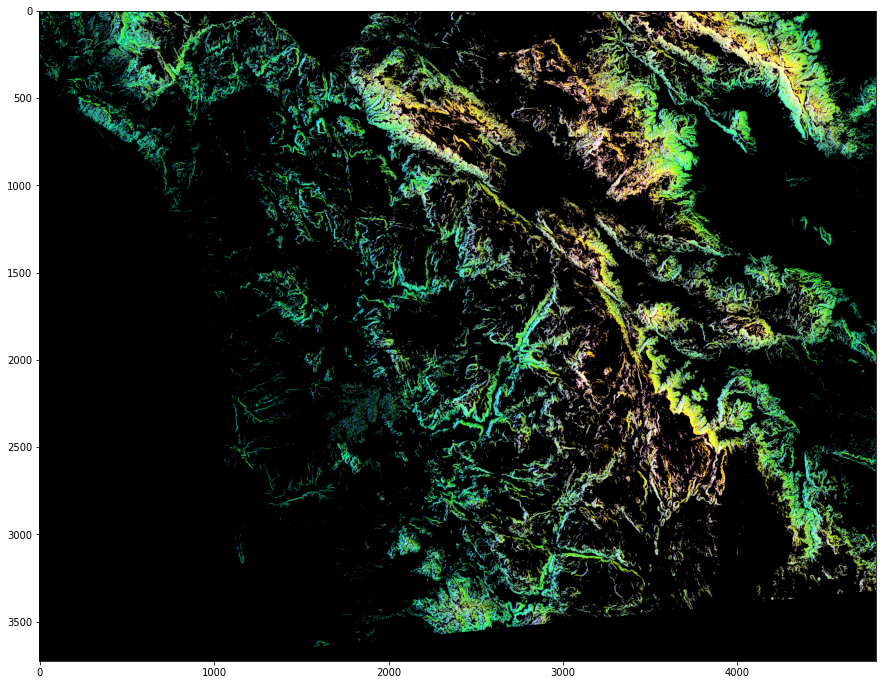

In [26]:
photo_data = imageio.imread('../input/wildfire/sd-3layers.jpg')
green_mask = photo_data[:, : ,1] < 150

photo_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# Detecting Highly-BLUE Pixels

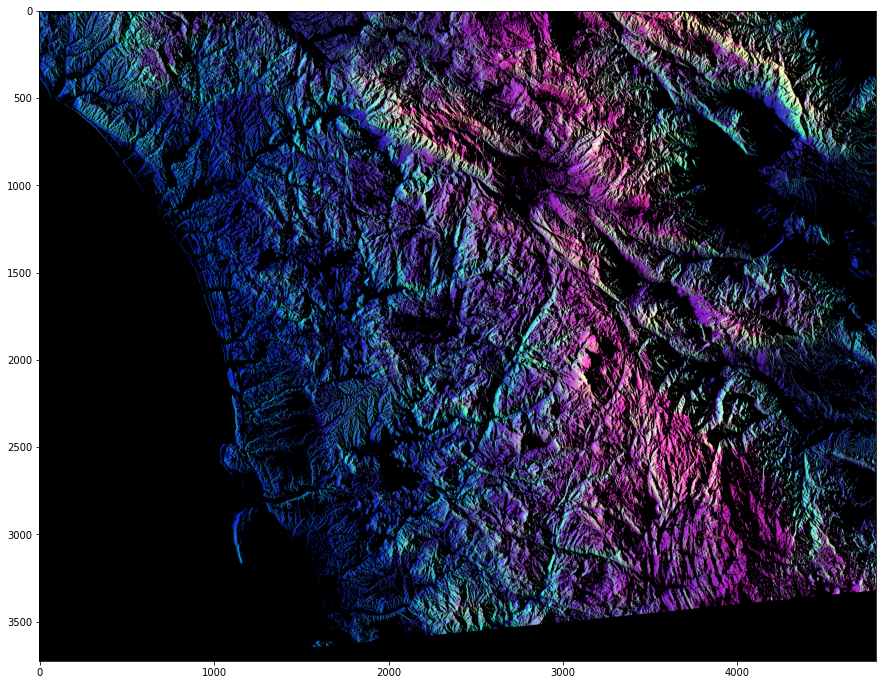

In [27]:
photo_data = imageio.imread('../input/wildfire/sd-3layers.jpg')
blue_mask  = photo_data[:, : ,2] < 150

photo_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE

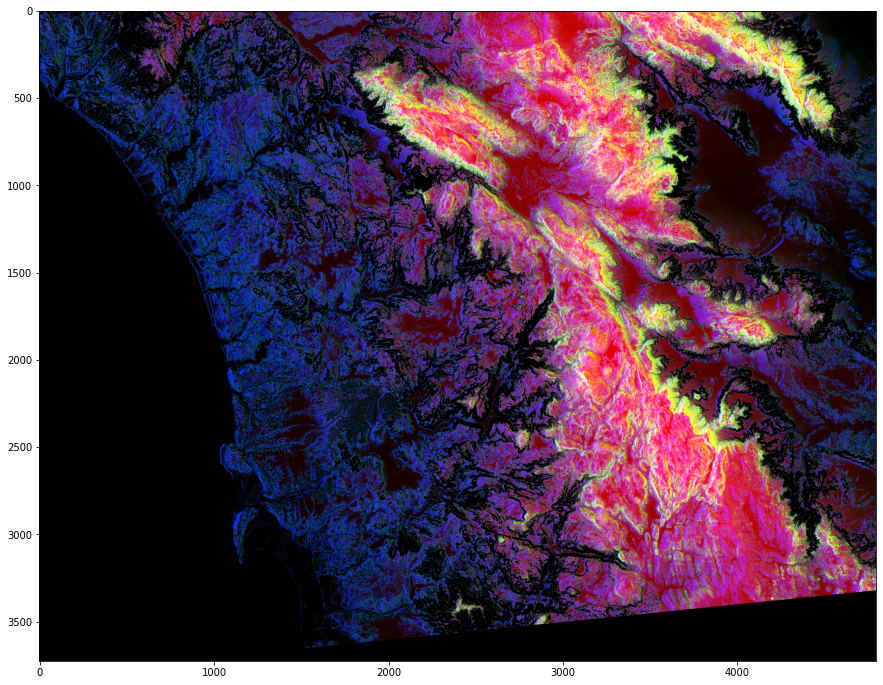

In [28]:
photo_data = imageio.imread('../input/wildfire/sd-3layers.jpg')

red_mask   = photo_data[:, : ,0] < 150
green_mask = photo_data[:, : ,1] > 100
blue_mask  = photo_data[:, : ,2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)